In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import compare_surfaces
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('../data/data_2015.csv')
townships = gpd.read_file('../data/township_geom/gwr_townships.shp')

<Axes: >

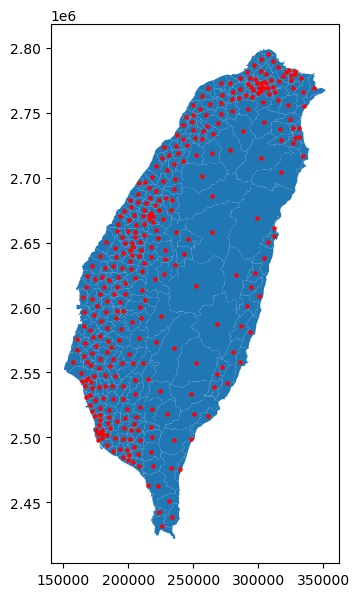

In [3]:
# Visualise township centroids
f, ax = plt.subplots(figsize = (7, 7))
townships.plot(ax=ax)
townships.centroid.plot(ax=ax, c='r', markersize = 5)

In [4]:
# Convert code column to integer
townships['TOWNCODE'] = townships['TOWNCODE'].astype(int) 

# Merge data with township geom
tw = townships.merge(data, left_on='TOWNCODE', right_on='code', how='left')
tw.drop(['TOWNCODE', 'COUNTYCODE', 'TOWNENG'], axis=1, inplace=True)

# Find centroid coordinates
tw['X'] = tw.centroid.x
tw['Y'] = tw.centroid.y

tw.head()

,geometry,code,tavg,tmax,tmin,wind_speed,precip,pop_density,elevation,built_up_area,case_count,dengue_per_10k,X,Y
0,"POLYGON ((291944.638 2568006.258, 291947.405 2...",10014020,23.627437,35.640970,15.952420,2.367448,116.732246,63.599528,413.733696,1.926,1,1.074691,286263.494069,2.558321e+06
1,"POLYGON ((203528.677 2484633.419, 203536.121 2...",10013210,25.163356,34.142219,15.793147,1.965104,128.832112,479.607514,7.620464,15.586,4,2.580146,203359.124321,2.481136e+06
2,"POLYGON ((178880.906 2634847.772, 178880.637 2...",10009130,23.757346,31.402255,16.711108,2.775119,113.485417,288.223428,4.883411,22.517,0,0.000000,172346.852129,2.632129e+06
3,"POLYGON ((207482.995 2641408.234, 207483.92 26...",10007120,24.458718,33.888881,16.488829,1.638376,114.183257,1013.131353,80.686612,22.216,1,0.286508,208276.487263,2.639284e+06
4,"POLYGON ((207797.064 2641448.517, 207743.999 2...",10007170,24.590092,34.179969,16.532853,1.413184,110.064540,1018.133349,106.896390,22.612,11,3.008341,209498.379068,2.644610e+06


In [5]:
# Prepare inputs
tw_y = tw['dengue_per_10k'].values.reshape((-1, 1)) # y – dependent variable
expl_variables = ['tavg', 'tmax', 'precip', 'pop_density', 'elevation', 'built_up_area']
tw_X = tw[expl_variables].values # X – matrix of explanatory variables
u = tw['X']
v = tw['Y']
tw_coords = list(zip(u, v)) # polygon centroid coordinates


In [6]:
# Standardisation
tw_X = (tw_X - tw_X.mean(axis=0)) / tw_X.std(axis=0)
tw_y = (tw_y - tw_y.mean(axis=0)) / tw_y.std(axis=0)

#tw_y = np.sqrt(tw_y) # transformation for right-skewed dist

In [7]:
# Select bandwidth for GWR model
bw_selector = Sel_BW(tw_coords, tw_y, tw_X)
gwr_bw = bw_selector.search()
print(gwr_bw)

66.0


In [8]:
# Fit GWR model
gwr_model = GWR(tw_coords, tw_y, tw_X, gwr_bw, name_x=expl_variables).fit()
gwr_model.summary()

Model type                                                         Gaussian
Number of observations:                                                 349
Number of covariates:                                                     7

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            263.429
Log-likelihood:                                                    -446.125
AIC:                                                                906.249
AICc:                                                               908.673
BIC:                                                              -1739.006
R2:                                                                   0.245
Adj. R2:                                                              0.232

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [9]:
# Select bandwidth for MGWR model
bw_selector = Sel_BW(tw_coords, tw_y, tw_X, multi=True) 
mgwr_bw = bw_selector.search()
print(mgwr_bw)

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[106.  57. 347. 347.  57. 347. 347.]


In [10]:
# Fit MGWR model
mgwr_model = MGWR(tw_coords, tw_y, tw_X, bw_selector, name_x=expl_variables).fit()
mgwr_model.summary()

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Model type                                                         Gaussian
Number of observations:                                                 349
Number of covariates:                                                     7

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            263.429
Log-likelihood:                                                    -446.125
AIC:                                                                906.249
AICc:                                                               908.673
BIC:                                                              -1739.006
R2:                                                                   0.245
Adj. R2:                                                              0.232

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

#### Record results into dataframe

In [11]:
# Create an empty datafarame for diagnostics
column_names = ['model', 'variable', 'bandwidth', 'ENP', 'AICc', 'R2', 'adj_R2', 'adj_alpha', 'adj_tval']
diagnostics = pd.DataFrame(columns=column_names)

In [12]:
# Insert model results
diagnostics.loc[0] = [
                        'gwr', # model 
                        None, 
                        gwr_bw, # bandwidth
                        gwr_model.ENP, # effective No. of parameters
                        gwr_model.aicc, # corrected Akaike Information Criterion
                        gwr_model.R2, # r-squared
                        gwr_model.adj_R2, # adjusted r-squared
                        gwr_model.adj_alpha[1], # adjusted alpha (95%)
                        gwr_model.critical_tval() # adjusted t-value (95%)
]
diagnostics.loc[1] = ['mgwr', None, None, mgwr_model.ENP, mgwr_model.aicc, mgwr_model.R2, mgwr_model.adj_R2, mgwr_model.adj_alpha[1], mgwr_model.critical_tval(mgwr_model.adj_alpha[1])]
diagnostics.loc[2] = ['mgwr', 'intercept', mgwr_bw[0], mgwr_model.ENP_j[0], None, None, None, mgwr_model.adj_alpha_j[0][1], mgwr_model.critical_tval()[0]]
diagnostics.loc[3] = ['mgwr', expl_variables[0], mgwr_bw[1], mgwr_model.ENP_j[1], None, None, None, mgwr_model.adj_alpha_j[1][1], mgwr_model.critical_tval()[1]]
diagnostics.loc[4] = ['mgwr', expl_variables[1], mgwr_bw[2], mgwr_model.ENP_j[2], None, None, None, mgwr_model.adj_alpha_j[2][1], mgwr_model.critical_tval()[2]]
diagnostics.loc[5] = ['mgwr', expl_variables[2], mgwr_bw[3], mgwr_model.ENP_j[3], None, None, None, mgwr_model.adj_alpha_j[3][1], mgwr_model.critical_tval()[3]]
diagnostics.loc[6] = ['mgwr', expl_variables[3], mgwr_bw[4], mgwr_model.ENP_j[4], None, None, None, mgwr_model.adj_alpha_j[4][1], mgwr_model.critical_tval()[4]]
diagnostics.loc[7] = ['mgwr', expl_variables[4], mgwr_bw[5], mgwr_model.ENP_j[5], None, None, None, mgwr_model.adj_alpha_j[5][1], mgwr_model.critical_tval()[5]]
diagnostics.loc[8] = ['mgwr', expl_variables[5], mgwr_bw[6], mgwr_model.ENP_j[6], None, None, None, mgwr_model.adj_alpha_j[6][1], mgwr_model.critical_tval()[6]]

diagnostics

/var/folders/xj/422_hdhn1bz0x9_khxxv4d100000gn/T/ipykernel_81000/3166016682.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  diagnostics.loc[1] = ['mgwr', None, None, mgwr_model.ENP, mgwr_model.aicc, mgwr_model.R2, mgwr_model.adj_R2, mgwr_model.adj_alpha[1], mgwr_model.critical_tval(mgwr_model.adj_alpha[1])]
/var/folders/xj/422_hdhn1bz0x9_khxxv4d100000gn/T/ipykernel_81000/3166016682.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  diagnostics.loc[2] = ['mgwr', 'intercept', mgwr_bw[0], mg

,model,variable,bandwidth,ENP,AICc,R2,adj_R2,adj_alpha,adj_tval
0,gwr,None,66.0,66.218434,555.105001,0.822025,0.780201,0.005286,2.806790
1,mgwr,None,NaN,31.724092,511.947577,0.793730,0.773040,0.011033,2.555354
2,mgwr,intercept,106.0,4.581761,NaN,NaN,NaN,0.010913,2.559225
3,mgwr,tavg,57.0,12.550454,NaN,NaN,NaN,0.003984,2.898771
4,mgwr,tmax,347.0,1.355909,NaN,NaN,NaN,0.036876,2.095199
5,mgwr,precip,347.0,1.335093,NaN,NaN,NaN,0.037451,2.088815
6,mgwr,pop_density,57.0,9.622405,NaN,NaN,NaN,0.005196,2.812403
7,mgwr,elevation,347.0,1.111553,NaN,NaN,NaN,0.044982,2.012076
8,mgwr,built_up_area,347.0,1.166917,NaN,NaN,NaN,0.042848,2.032638


#### Visualise (M)GWR results

Text(0.5, 1.0, 'MGWR Standardised Residuals')

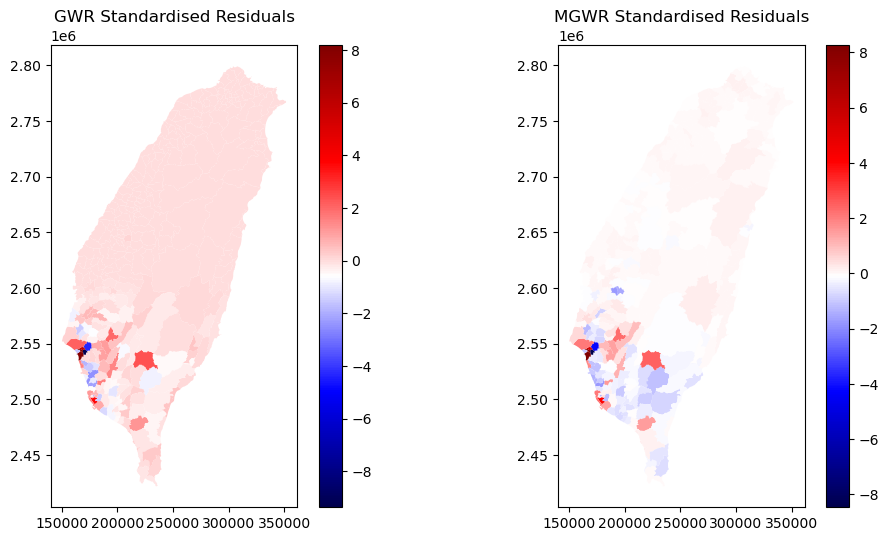

In [13]:
# Plot standardised residuals
f, ax = plt.subplots(1, 2, figsize=(12,6))

# GWR
tw['gwr_std_res'] = gwr_model.std_res
tw.plot('gwr_std_res', legend = True, ax=ax[0], cmap='seismic')

# MGWR
# Standardized residuals without influence matrix
std_residuals = mgwr_model.resid_response.reshape((-1, 1)) / np.std(mgwr_model.resid_response)
tw['mgwr_std_res'] = std_residuals
tw.plot('mgwr_std_res', legend = True, ax=ax[1], cmap='seismic')

ax[0].set_title("GWR Standardised Residuals")
ax[1].set_title("MGWR Standardised Residuals")

In [14]:
# Inserlt local parameter estimates into dataframe
# GWR
tw['gwr_intercept'] = gwr_model.params[:,0]
tw['gwr_tavg'] = gwr_model.params[:,1]
tw['gwr_tmax'] = gwr_model.params[:,2]
tw['gwr_precip'] = gwr_model.params[:,3]
tw['gwr_pop'] = gwr_model.params[:,4]
tw['gwr_elev'] = gwr_model.params[:,5]
tw['gwr_bua'] = gwr_model.params[:,6]
# MGWR
tw['mgwr_intercept'] = mgwr_model.params[:,0]
tw['mgwr_tavg'] = mgwr_model.params[:,1]
tw['mgwr_tmax'] = mgwr_model.params[:,2]
tw['mgwr_precip'] = mgwr_model.params[:,3]
tw['mgwr_pop'] = mgwr_model.params[:,4]
tw['mgwr_elev'] = mgwr_model.params[:,5]
tw['mgwr_bua'] = mgwr_model.params[:,6]

# Find insignificant values for masking
gwr_filtered_t = gwr_model.filter_tvals()
mgwr_filtered_t = mgwr_model.filter_tvals()

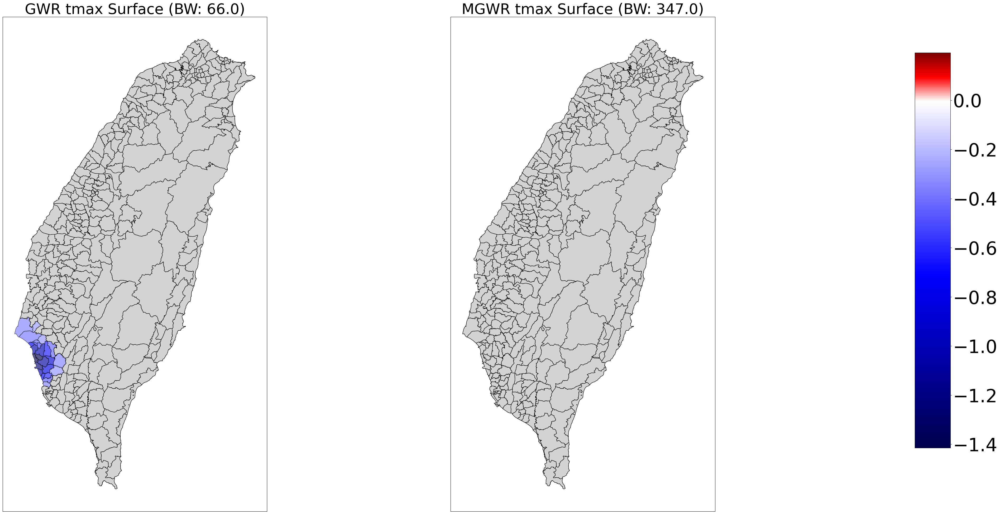

In [15]:
kwargs1 = {'edgecolor': 'black', 'alpha': .65}
kwargs2 = {'edgecolor': 'black'}

compare_surfaces(tw, 'gwr_tmax', 'mgwr_tmax',
                gwr_filtered_t[:, 2], gwr_bw, mgwr_filtered_t[:, 2],
                mgwr_bw[2], 'tmax', kwargs1, kwargs2)

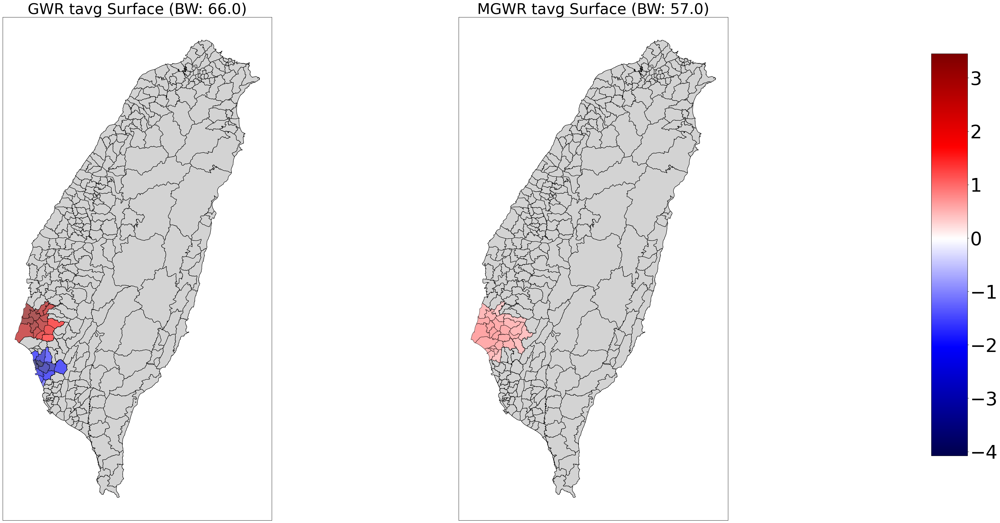

In [16]:
compare_surfaces(tw, 'gwr_tavg', 'mgwr_tavg',
                gwr_filtered_t[:, 1], gwr_bw, mgwr_filtered_t[:, 1],
                mgwr_bw[1], 'tavg', kwargs1, kwargs2)

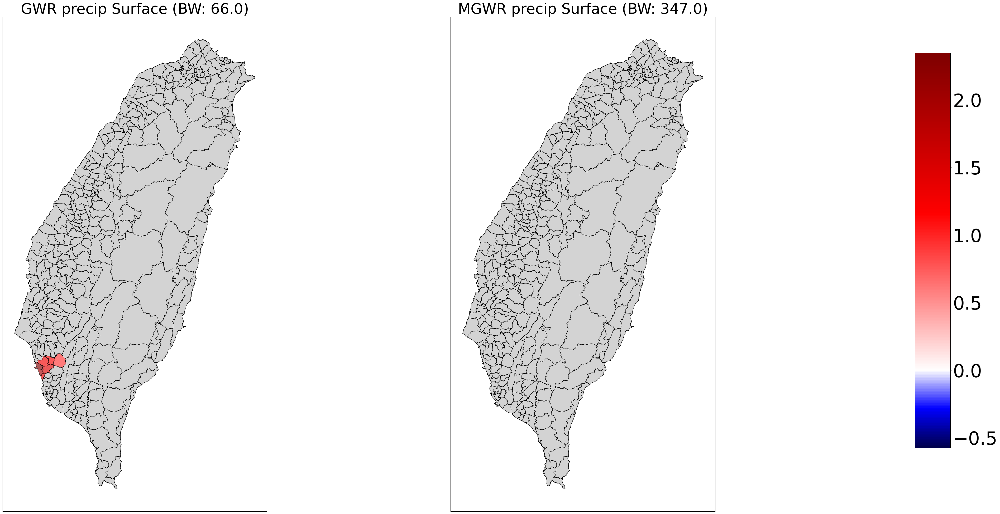

In [17]:
compare_surfaces(tw, 'gwr_precip', 'mgwr_precip',
                gwr_filtered_t[:, 3], gwr_bw, mgwr_filtered_t[:, 3],
                mgwr_bw[3], 'precip', kwargs1, kwargs2)

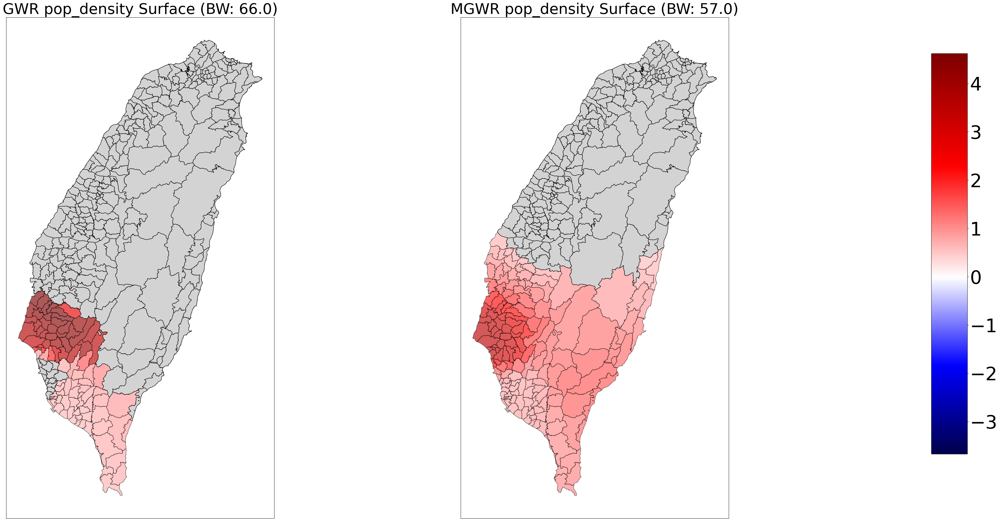

In [18]:
compare_surfaces(tw, 'gwr_pop', 'mgwr_pop',
                gwr_filtered_t[:, 4], gwr_bw, mgwr_filtered_t[:, 4],
                mgwr_bw[4], 'pop_density', kwargs1, kwargs2)

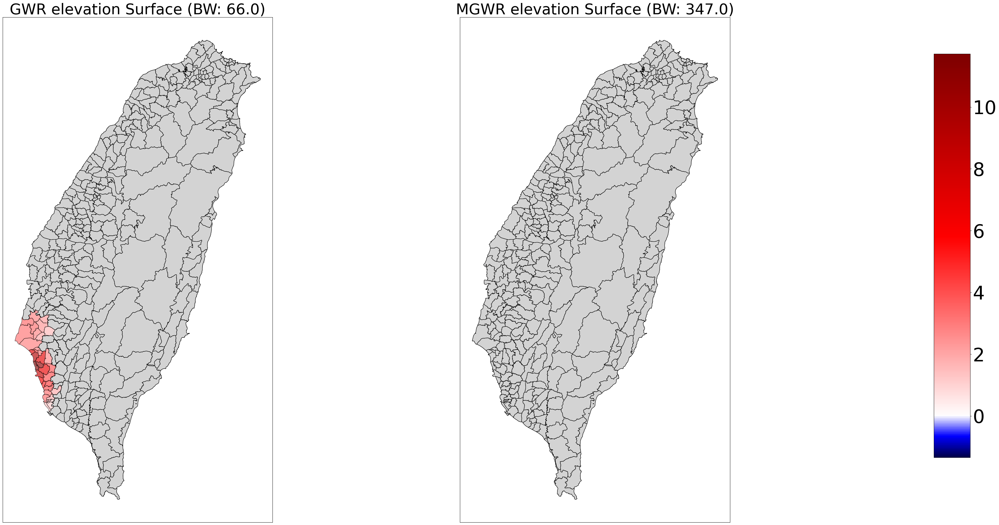

In [19]:
compare_surfaces(tw, 'gwr_elev', 'mgwr_elev',
                gwr_filtered_t[:, 5], gwr_bw, mgwr_filtered_t[:, 5],
                mgwr_bw[5], 'elevation', kwargs1, kwargs2)

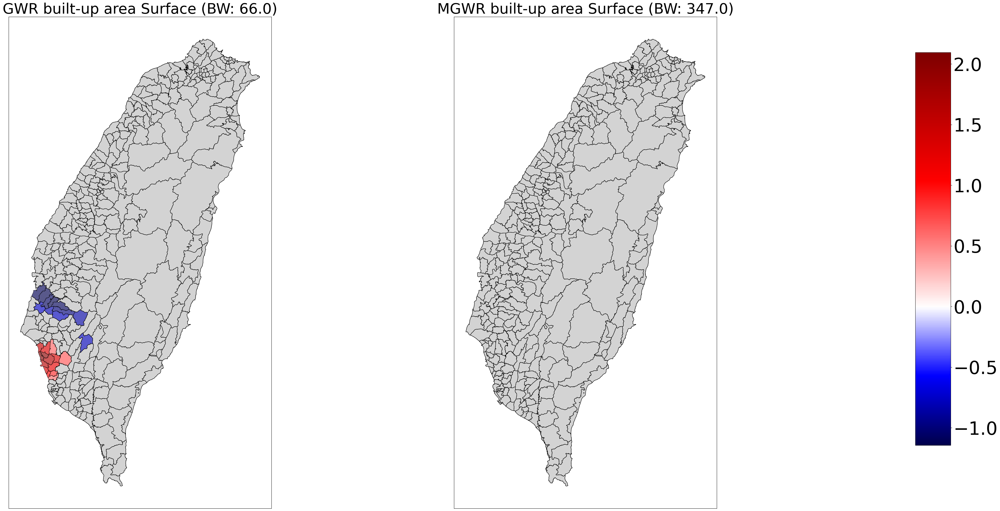

In [20]:
compare_surfaces(tw, 'gwr_bua', 'mgwr_bua',
                gwr_filtered_t[:, 6], gwr_bw, mgwr_filtered_t[:, 6],
                mgwr_bw[6], 'built-up area', kwargs1, kwargs2)

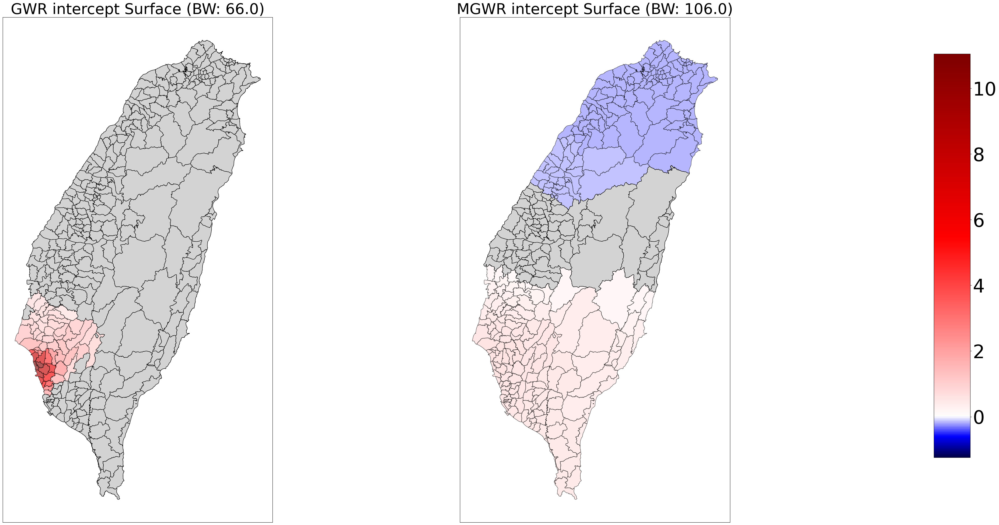

In [21]:
compare_surfaces(tw, 'gwr_intercept', 'mgwr_intercept',
                gwr_filtered_t[:, 0], gwr_bw, mgwr_filtered_t[:, 0],
                mgwr_bw[0], 'intercept', kwargs1, kwargs2)